# Test Dataloader in dataset.py

In [3]:
# install packages
import yaml
import os
import json
import torch
from torch.utils.data import Dataset
from torch import randint
from torchmetrics.functional.segmentation import mean_iou
from torchvision.transforms import Compose, Resize, ToTensor
from PIL import Image
import matplotlib.pyplot as plt
from pycocotools import mask as coco_mask
from pycocotools.coco import COCO
import numpy as np
from sharkbody_seg.dataset import SharkBody, sharkBodyCrop, compute_custom_crop_size



Import Data/Annotations

In [4]:
config_file_path = '/home/Alexandra/Projects/bodycondition/sharkbody_seg/runs/unet_smp/crop_center_coord/config/config.yaml' # config file path
with open(config_file_path, 'r') as file: cfg = yaml.safe_load(file) # load yaml as cfg

Functions from earth_obs_seg (Bjorn)

# Test each function

In [5]:
# instantiate shark body
dataset = SharkBody(cfg, split='train')

loading annotations into memory...
Done (t=0.06s)
creating index...
index created!


In [4]:
# check for missing center coordinates
for i in range(len(dataset)):
    sample = dataset[i]
    image_name = sample['filename']
    
    # Get center coordinates for the image
    center_y, center_x = dataset.center_dict.get(image_name, (None, None))
    
    # If the center coordinates are None, add the image to the list
    if center_y is None or center_x is None:
        print(image_name)

Images without center coordinates:
07202023PANB0803.JPG
12132023PAMB0201.JPG
12032024PAAN0504.JPG


In [ ]:
# test data loader
for i in range(200):
    print(dataset[i])  # Should print (image_tensor, label)

In [6]:
# test len function
print(len(dataset)) 

2


In [ ]:
# test the __getitem__ function
sample = dataset[0]
img_tensor = sample['image']  
mask_tensor = sample['mask'] 

sample

In [8]:
sample["mask"].dtype

torch.float32

In [ ]:
# check dimensions of tensors
print(f"Image dimensions: {img_tensor.shape if hasattr(img_tensor, 'shape') else img_tensor.size()}") 

# Check the dimensions of the mask
print(f"Mask dimensions: {mask_tensor.shape if hasattr(mask_tensor, 'shape') else mask_tensor.size()}")  


Image dimensions: torch.Size([3, 224, 224])
Mask dimensions: torch.Size([1, 224, 224])


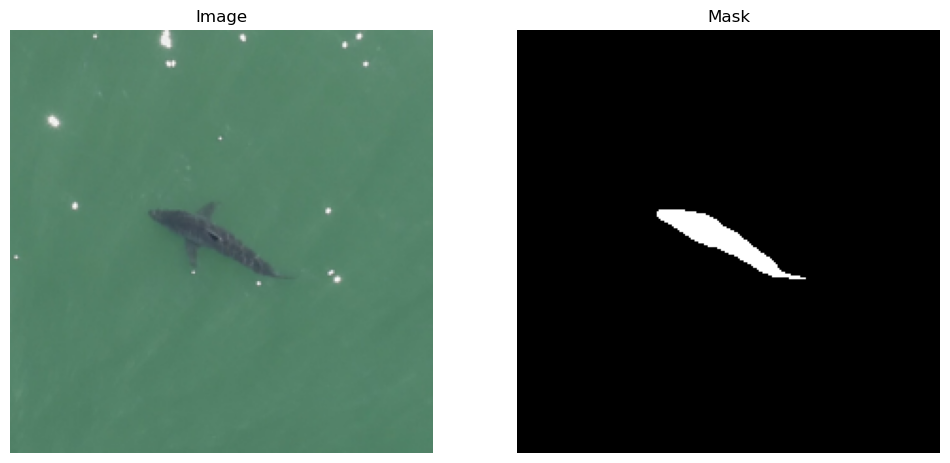

In [13]:
sample = dataset[1]
img_tensor = sample['image']  
mask_tensor = sample['mask'] 

# check plots 
img_display = img_tensor.numpy().transpose(1, 2, 0)  # Convert to (H, W, C)
mask_display = mask_tensor.squeeze(0).numpy()  # Convert from (1, H, W) to (H, W)

fig, axes = plt.subplots(1, 2, figsize=(12, 6)) # two subplots

# image plot
axes[0].imshow(img_display)
axes[0].set_title("Image")
axes[0].axis('off') 

# mask plot
axes[1].imshow(mask_display, cmap='gray')  # Use 'gray' colormap for mask
axes[1].set_title("Mask")
axes[1].axis('off') 

plt.show()


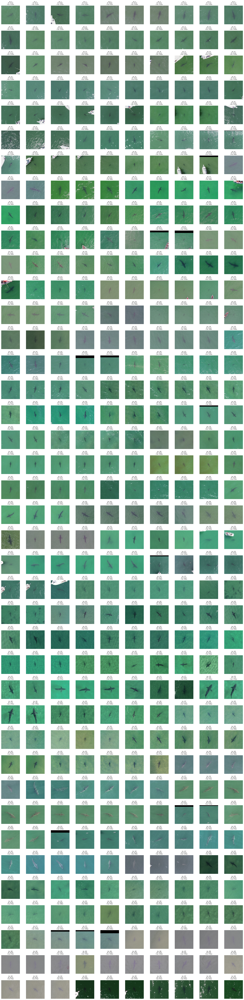

In [6]:
# check cropping
start_idx = 0
num_images = 400
cols = 10
rows = num_images // cols

fig, axes = plt.subplots(rows, cols, figsize=(cols*2, rows*2))
axes = axes.flatten()

for i in range(num_images):
    sample = dataset[start_idx + i]
    img_tensor = sample['image']
    img_display = img_tensor.numpy().transpose(1, 2, 0)
    
    relative_altitude = sample['relative_altitude']
    crop_size = sample['crop_size']  # use crop_size instead of image width
    
    axes[i].imshow(img_display)
    axes[i].axis('off')
    axes[i].set_title(f"Idx: {start_idx + i}\nAlt: {relative_altitude:.1f}m\nCrop: {crop_size}px", fontsize=6)

plt.tight_layout()
plt.show()
